In [1]:
# Standard imports
import os
from pathlib import Path

import numpy as np
import xarray as xr
from sklearn.decomposition import PCA
from scipy.stats import skew, kurtosis, probplot

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from regionmask.defined_regions import ar6
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

import warnings
warnings.filterwarnings('ignore')

from meteor import MeteorInterface, Cmip6MeteorDataGetter, geo_data_utils
from meteor.noise_model.ae_varx import AEVARXNoiseModel

print("✅ Imports complete")

✅ Imports complete


In [2]:
SEED = 42
RNG = np.random.default_rng(SEED)

MODEL = 'NorESM2-MM'
VARIABLES = ['tas', 'pr']
N_REALIZATIONS_SMALL = 10
N_REALIZATIONS = 300
SCENARIO = 'ssp245'
START_YEAR = 1850
END_YEAR = 2100

regions = ['NEU', 'NSA', 'EAS']
region_names = {
    'NEU': 'Northern Europe',
    'NSA': 'Northern South America',
    'EAS': 'East Asia'
}

cities = {
    'Oslo': {'lat': 59.9, 'lon': 10.8},
    'Delhi': {'lat': 28.6, 'lon': 77.2},
    'Cairo': {'lat': 30.0, 'lon': 31.2},
    'Beijing': {'lat': 39.9, 'lon': 116.4}
}

timeseries = ['global']
timeseries += [f'regional:{r}' for r in regions]
timeseries += [f"point:{cities[c]['lat']},{cities[c]['lon']}" for c in cities.keys()]

print(f"Model: {MODEL}")
print(f"Variables: {VARIABLES}")
print(f"Spatial aggregations: {len(timeseries)}")
for ts in timeseries:
    print(f"  {ts}")

Model: NorESM2-MM
Variables: ['tas', 'pr']
Spatial aggregations: 8
  global
  regional:NEU
  regional:NSA
  regional:EAS
  point:59.9,10.8
  point:28.6,77.2
  point:30.0,31.2
  point:39.9,116.4


## The full training data

In [3]:
data_getter = Cmip6MeteorDataGetter(
    exps=["piControl", "historical", "ssp245", "ssp126", "ssp585"],
    flds=VARIABLES,
    dbe=['CMIP', 'CMIP', 'ScenarioMIP', 'ScenarioMIP', 'ScenarioMIP'],
    enable_cache=True
)

cmip6_data_raw = data_getter.make_meteor_training_data_composite(
    ["historical", "ssp245"], MODEL, monthly=True
)
picontrol_data = data_getter.make_meteor_training_data(
    "piControl", MODEL, monthly=True
)

# Build anomaly time series (tas)
cmip6_timeseries = {}
cmip6_point_data = {}

# Global
cmip6_global_abs = geo_data_utils.global_mean(cmip6_data_raw['tas'])
picontrol_global = geo_data_utils.global_mean(picontrol_data['tas'])
picontrol_baseline = picontrol_global.mean()
cmip6_timeseries['global'] = cmip6_global_abs - picontrol_baseline

# Regions
for region in regions:
    cmip6_reg_abs = geo_data_utils.regional_mean(cmip6_data_raw['tas'], region)
    picontrol_reg = geo_data_utils.regional_mean(picontrol_data['tas'], region)
    cmip6_timeseries[f'regional:{region}'] = cmip6_reg_abs - picontrol_reg.mean()

# Points
for city_name, coords in cities.items():
    key = f"point:{coords['lat']},{coords['lon']}"
    cmip6_pt = geo_data_utils.extract_point(cmip6_data_raw['tas'], coords['lat'], coords['lon'])
    picontrol_pt = geo_data_utils.extract_point(picontrol_data['tas'], coords['lat'], coords['lon'])
    cmip6_point_data[key] = cmip6_pt - picontrol_pt.mean()

print(f"CMIP6 tas shape: {cmip6_data_raw['tas'].shape}")
print(f"Point locations loaded: {len(cmip6_point_data)}")

CMIP6 tas shape: (1, 3012, 192, 288)
Point locations loaded: 4


## Getting `X_ae` (the actual AE training data)

The AE does not train on raw temperature/precipitation; it trains on *seasonal-cycle-removed anomalies*.
The preprocessing pipeline inside `AEVARXNoiseModel.fit()` is:
1. Compute a smoothed global-mean temperature trajectory `t_glob`
2. Fit a harmonic seasonal-cycle model to `(time, t_glob, Y)`
3. Subtract the seasonal cycle → anomalies
4. Call `reshape_anomalies(anomalies, data_type)` → `X_ae`  (shape `(n_time, n_lat × n_lon)` for `data_type='mlp'`)

`AEVARXNoiseModel.prepare_training_data_for_AE()` is a **static method** that runs exactly these steps and returns `X_ae`, without fitting the AE or the VARX model.  Because it is a static method it can be called directly on the class — no model instance needed:

```python
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data, variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",   # 'mlp' → (n_time, n_lat*n_lon)  |  'conv' → (n_time, 1, n_lat, n_lon)
)
```
## Investigating `X_ae`
The anomalies are supposed to have the seasonal cycle removed. There are however many other modes of variability in the earth system. To understand what our AE is actually having to model we will have a look at the `X_ae`s - starting with the fields used by convolutional AE's (even though we will model it later) as it is much more inuitive to see if the `SeasonalModel` is working correctly. We will extract 3 random samples from each month to see.

In [4]:
# Prepare AE training arrays for tas (done once; reused throughout the notebook).
# data_type='conv' → (n_time, 1, n_lat, n_lon)  — spatial field for diagnostic plots
# data_type='mlp'  → (n_time, n_lat * n_lon)     — flat vector for MLP / VARX
X_ae_conv = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="conv",
)
X_ae_mlp = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",
)

# Spatial grid
lats = cmip6_data_raw["tas"].lat.values
lons = cmip6_data_raw["tas"].lon.values

print(f"X_ae_conv : {X_ae_conv.shape}  (n_time, 1, n_lat, n_lon)")
print(f"X_ae_mlp  : {X_ae_mlp.shape}  (n_time, n_lat*n_lon)")
print(f"lats      : {lats.shape}  [{lats[0]:.1f} ... {lats[-1]:.1f}]")
print(f"lons      : {lons.shape}  [{lons[0]:.1f} ... {lons[-1]:.1f}]")


X_ae_conv : (3012, 1, 192, 288)  (n_time, 1, n_lat, n_lon)
X_ae_mlp  : (3012, 55296)  (n_time, n_lat*n_lon)
lats      : (192,)  [-90.0 ... 90.0]
lons      : (288,)  [0.0 ... 358.8]


## Helper functions

In [5]:
from fys9429.ae_diagnostics import (
    plot_monthly_samples_grid,
    seasonal_cycle_before_after,
    summarize_anomaly_field_core,
    qqplot_anomaly_field,
    compute_eofs,
    plot_eof_maps,
    compute_temporal_stats_from_flat,
    plot_temporal_structure_flat,
)
print("✅ Diagnostic functions imported from fys9429.ae_diagnostics")


✅ Diagnostic functions imported from fys9429.ae_diagnostics


## tas

### Conv.
When we use a convolutional NN in the autoencoder `X_ae_conv` has shape `(n_time, 1, n_lats, n_lon)`. A sample in this conect is indexed by `[sample, :,:,:]`, that is one timestep is a sample.

In [6]:
X_ae_conv = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="conv",  # (n_time, n_lat, n_lon)
)

X_raw = cmip6_data_raw["tas"].isel(ens=0).values[:, np.newaxis, :, :]  # (T, 1, n_lat, n_lon)
print(f"X_ae_conv shape : {X_ae_conv.shape}")
print(f"X_ae_conv range : [{X_ae_conv.min():.4f}, {X_ae_conv.max():.4f}]")
print(f"X_ae_conv std   : {X_ae_conv.std():.4f}")


X_ae_conv shape : (3012, 1, 192, 288)
X_ae_conv range : [-20.3367, 19.9445]
X_ae_conv std   : 1.7117


In [7]:
# ── Index helpers (reused in the sample plot below) ────────────────────────
lats = cmip6_data_raw.coords["lat"].values   # (n_lat,)
lons = cmip6_data_raw.coords["lon"].values   # (n_lon,)
n_lat, n_lon = len(lats), len(lons)
n_pts = n_lat * n_lon  # should match X_ae.shape[1]

# Latitude bands: label → (target_deg, colour, linestyle)
LAT_TARGETS = {
    "Eq. (0°)": ( 0,  "red",        "-"),
    "+30°":     ( 30, "orange",     "--"),
    "−30°":     (-30, "orange",     "--"),
    "+60°":     ( 60, "steelblue",  "-."),
    "−60°":     (-60, "steelblue",  "-."),
}

lat_bands = {}
for label, (target, color, ls) in LAT_TARGETS.items():
    row = int(np.argmin(np.abs(lats - target)))
    lat_bands[label] = dict(
        row=row, actual_lat=float(lats[row]),
        flat_start=row * n_lon,
        flat_end=(row + 1) * n_lon - 1,
        color=color, ls=ls,
    )

# Cities from the global `cities` dict defined in the config cell
city_flat = {}
for cname, ccoords in cities.items():
    row = int(np.argmin(np.abs(lats - ccoords["lat"])))
    col = int(np.argmin(np.abs(lons - ccoords["lon"])))
    city_flat[cname] = dict(
        row=row, col=col,
        flat_idx=row * n_lon + col,
        actual_lat=float(lats[row]),
        actual_lon=float(lons[col]),
    )

lon_min = float(cmip6_data_raw['tas'].lon.min())
lon_max = float(cmip6_data_raw['tas'].lon.max())
lat_min = float(cmip6_data_raw['tas'].lat.min())
lat_max = float(cmip6_data_raw['tas'].lat.max())


extent = [lon_min, lon_max, lat_min, lat_max]  # [x0, x1, y0, y1]
month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
lat2d, lon2d = np.meshgrid(lats, lons, indexing="ij")
region_masks = {
    "Global": np.ones_like(lat2d, dtype=bool),
    "Tropics (|lat|<=20)": np.abs(lat2d) <= 20,
    "nh_midlat. (30<lat<=60)": (np.abs(lat2d) > 30) & (np.abs(lat2d) <= 60) & (lat2d > 0),
    "sh_midlat. (-60<lat<=-30)": (np.abs(lat2d) > 30) & (np.abs(lat2d) <= 60) & (lat2d < 0),
    "arctic (lat>=66)": lat2d >= 66,
    "antarctic (lat<=-66)": lat2d <= -66,
}

random_indices_maps = {
    i: RNG.choice(int(X_ae_conv.shape[0]/12), size=3, replace=False) * 12 + i
    for i in range(1, 13)
}
print(f"Randomly selected indices for testing: {random_indices_maps}")

month_idx = np.arange(X_ae_conv.shape[0]) % 12  # or from your time coordinate


Randomly selected indices for testing: {1: array([1969,  265, 2317]), 2: array([ 254, 2102, 2558]), 3: array([1575, 2919, 2211]), 4: array([1540, 2344,  388]), 5: array([1493, 1109,  545]), 6: array([2478, 1926, 1206]), 7: array([1351,  283,  679]), 8: array([2492, 2576,  188]), 9: array([2109,  501, 2277]), 10: array([2902, 1342, 2698]), 11: array([1103, 2279,  587]), 12: array([ 132, 1644,  468])}


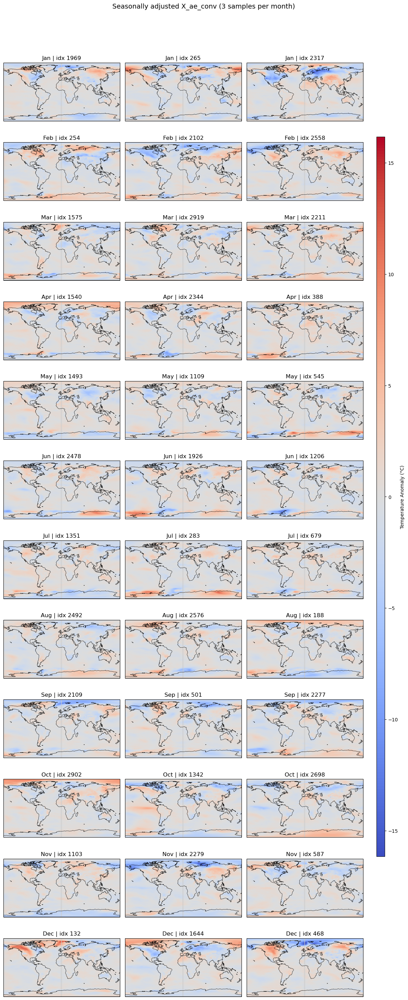

In [8]:
fig = plot_monthly_samples_grid(
    X=X_ae_conv,
    random_indices=random_indices_maps,
    extent=extent,
    month_names=month_names,
    suptitle="Seasonally adjusted X_ae_conv (3 samples per month)",
)
plt.show()


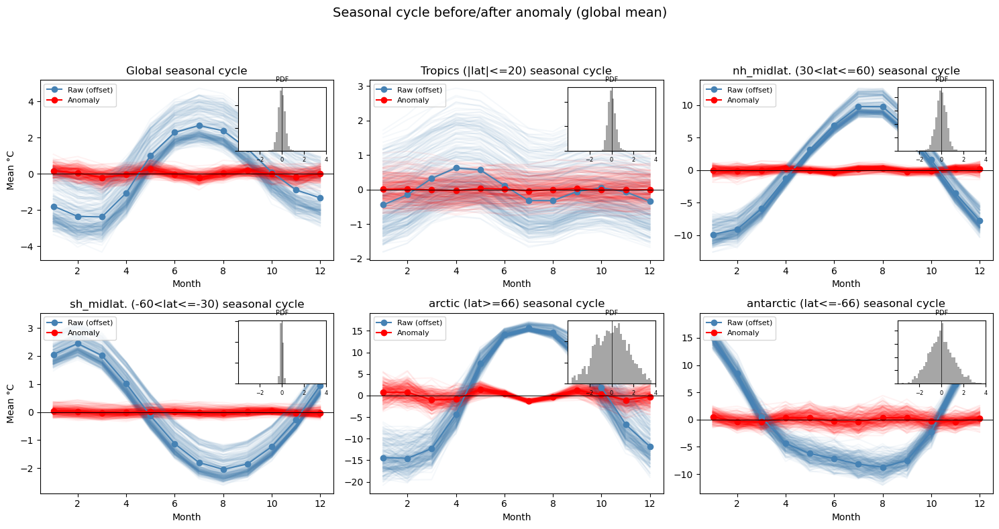

In [9]:
nrows = 2
ncols = np.ceil(len(region_masks) / nrows).astype(int)
seasonal_cycle_fig = seasonal_cycle_before_after(
    X_raw=X_raw,                # (T, 1, n_lat, n_lon)
    X_ae_conv=X_ae_conv,           # (T, 1, n_lat, n_lon)
    month_idx=month_idx,        # length T, values 0..11
    region_masks=region_masks,                  # (n_lat, n_lon) bool
    figtitle="Seasonal cycle before/after anomaly (global mean)",
    units="°C",
    subplot_kwargs={
        "nrows": nrows,
        "ncols": ncols,
        "figsize": (5 * ncols, 4 * nrows),
        "sharey": False
    }
)
plt.show()


* The anomalies after the seasonal harmonics model are larger in high latitudes, (the seasonal cycle is much larger there in general as seen in the time series.
* it is hard to identify any monthly pattern in the anomalies which implies that the removal the seasonal harmonics model har removed alot of the intraannual variability of the model data's mean tendency. As we see from the anomaly lines (spread in the light lines and the PDFs) the internal variability is however still present and it has some seasonality and spatial hetrogenicity - **this is our training objective**!
* To understand further what the seasonal harmonics model is not catching (spatially) we will have a look at some properties:
    * variance
    * Skewness
    * Kurtosis
    * Distributions (hist and QQ-plot)
    * EOF's from a PCA

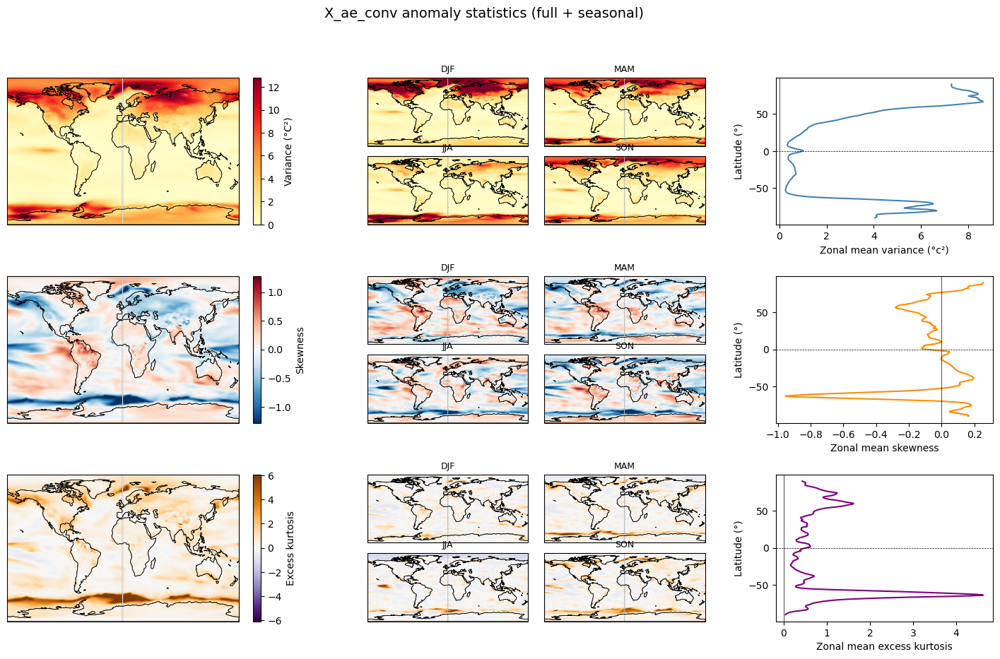

In [10]:
stats_core, fig_core = summarize_anomaly_field_core(
    X_ae_conv=X_ae_conv,
    lats=lats,
    lons=lons,
    extent=extent,
    month_idx=month_idx,
    units="°C",
    title="X_ae_conv anomaly statistics (full + seasonal)",
)
plt.show()


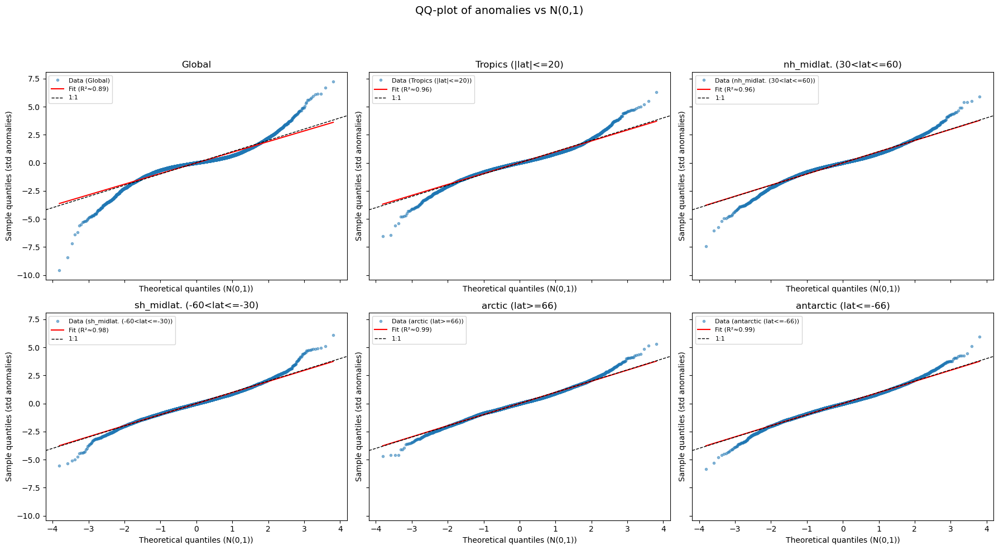

In [11]:
fig_qq = qqplot_anomaly_field(
    X_ae_conv, lats, lons,
    region_masks=region_masks,
    subplot_kwargs={
        "nrows": 2, "ncols": 3, "figsize": (18, 10), "sharex": True, "sharey": True},
)


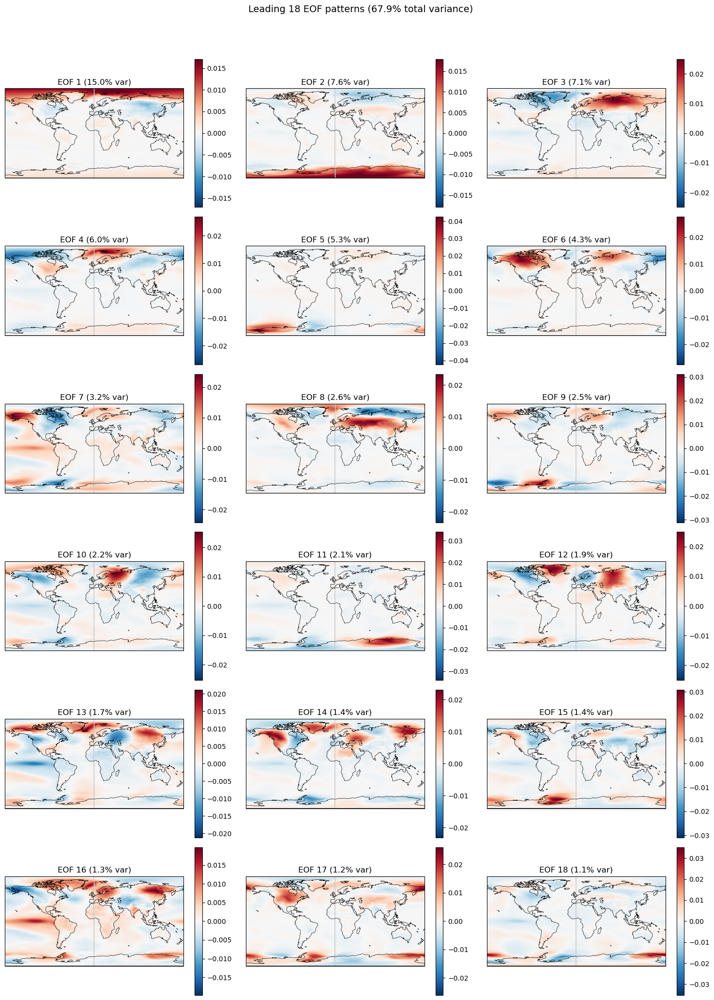

In [12]:
eofs, pcs, var_frac = compute_eofs(X_ae_conv, n_modes=18)
fig_eofs = plot_eof_maps(eofs, var_frac, lats, lons, extent)


* As suspected from the samples plotted above the variance is highest at high latitudes - a low dimensional latent space will likely underfit regions such as the tropics.
* The EOF analysis show that there is not one dominating mode of variability - the EOF's are identifying local modes of variability.

For further interpretation we need to restate what we are looking at. Since we have regressed the gridcells against a smoothed global temperature trend $T_{glob}$ the EOFs are not really catching a global forced trajectory rather they are **departures from globally coherent warming-scaled seasonality**.

### MLP
When we want to use MLP (as opposed to conv. NNs) in the autoencoder `X_ae` has shape `(n_time, n_gridpoints)`. When fitting we treat `n_gridpoints` as a the sample and let `n_time` be the number of samples. To reference features in the anomalies to the spatial pattern (for personal intuition) we see a globe plot of index id with some regions, latitudes, and points (cities) of interest. The grid index is increasing from south to north as seen in the plot.

In [13]:
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",  # (n_time, n_lat * n_lon)
)

print(f"X_ae shape : {X_ae.shape}")
print(f"X_ae range : [{X_ae.min():.4f}, {X_ae.max():.4f}]")
print(f"X_ae std   : {X_ae.std():.4f}")

X_ae shape : (3012, 55296)
X_ae range : [-20.3367, 19.9445]
X_ae std   : 1.7117


Latitude band flat-index ranges:
  Eq. (0°)    (actual -0.471°)  →  cols  27360 …  27647
  +30°        (actual +29.686°)  →  cols  36576 …  36863
  −30°        (actual -29.686°)  →  cols  18432 …  18719
  +60°        (actual +59.843°)  →  cols  45792 …  46079
  −60°        (actual -59.843°)  →  cols   9216 …   9503

City flat indices:
  Oslo      lat=+59.843°  lon=+11.250°  →  idx  45801
  Delhi     lat=+28.743°  lon=+77.500°  →  idx  36350
  Cairo     lat=+29.686°  lon=+31.250°  →  idx  36601
  Beijing   lat=+40.052°  lon=+116.250°  →  idx  39837


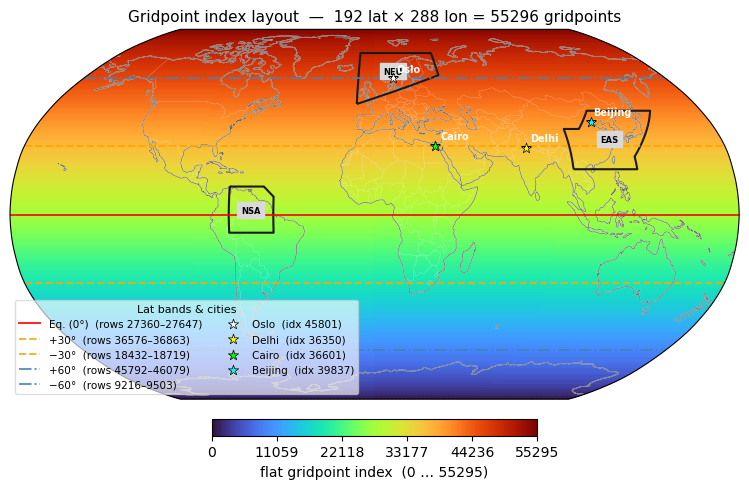

In [14]:
# lat/lon grid comes from the raw CMIP6 dataset
assert n_pts == X_ae.shape[1], f"Grid mismatch: {n_pts} vs {X_ae.shape[1]}"

# The flat index increases left-to-right, top-to-bottom,
# matching xr.stack(space=('lat', 'lon')).
idx_grid = np.arange(n_pts).reshape(n_lat, n_lon)

print("Latitude band flat-index ranges:")
for label, b in lat_bands.items():
    print(f"  {label:10s}  (actual {b['actual_lat']:+.3f}°)  →  cols {b['flat_start']:>6d} … {b['flat_end']:>6d}")
print("\nCity flat indices:")
for cname, c in city_flat.items():
    print(f"  {cname:<8s}  lat={c['actual_lat']:+.3f}°  lon={c['actual_lon']:+.3f}°  →  idx {c['flat_idx']:>6d}")

# ── Globe plot ──────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.set_global()

im = ax.pcolormesh(
    lons, lats, idx_grid,
    cmap="turbo",
    vmin=0, vmax=n_pts - 1,
    transform=ccrs.PlateCarree(),
    rasterized=True,
)
ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="white")
ax.add_feature(cfeature.BORDERS,   linewidth=0.3, edgecolor="white", alpha=0.4)

# Regions from AR6 (for reference, not exact boundaries)
ar6.all[list(region_names.keys())].plot(
    ax=ax,
    add_ocean=False,
    text_kws={"fontsize": 6, "fontweight": "bold"},
    label="abbrev"
)

# Latitude band lines
for label, b in lat_bands.items():
    lat_val = b["actual_lat"]
    ax.plot(
        [-179.9, 179.9], [lat_val, lat_val],
        transform=ccrs.PlateCarree(),
        color=b["color"], lw=1.4, ls=b["ls"], alpha=0.85,
        label=f"{label}  (rows {b['flat_start']}–{b['flat_end']})",
    )

# City markers
city_colors = ["white", "yellow", "lime", "cyan"]
for (cname, c), marker_color in zip(city_flat.items(), city_colors):
    ax.scatter(
        c["actual_lon"], c["actual_lat"],
        transform=ccrs.PlateCarree(),
        s=60, marker="*", color=marker_color, edgecolors="black", lw=0.5, zorder=5,
        label=f"{cname}  (idx {c['flat_idx']})",
    )
    ax.text(
        c["actual_lon"] + 3, c["actual_lat"] + 3, cname,
        transform=ccrs.PlateCarree(),
        fontsize=7, color="white", fontweight="bold",
        clip_on=True,
    )

cb = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.05, fraction=0.04, shrink=0.8)
cb.set_label(f"flat gridpoint index  (0 … {n_pts - 1})", fontsize=10)
cb.set_ticks(np.linspace(0, n_pts - 1, 6, dtype=int))

ax.legend(
    loc="lower left", fontsize=7.5, framealpha=0.65,
    title="Lat bands & cities", title_fontsize=8,
    ncol=2,
)
ax.set_title(
    f"Gridpoint index layout  —  {n_lat} lat × {n_lon} lon = {n_pts} gridpoints",
    fontsize=11,
)
plt.tight_layout()
plt.show()


In [15]:
random_indices_flat = RNG.choice(int(X_ae.shape[0]), size=5, replace=False)

Randomly selected indices for testing: [1103 2774 1237 2913 2240]


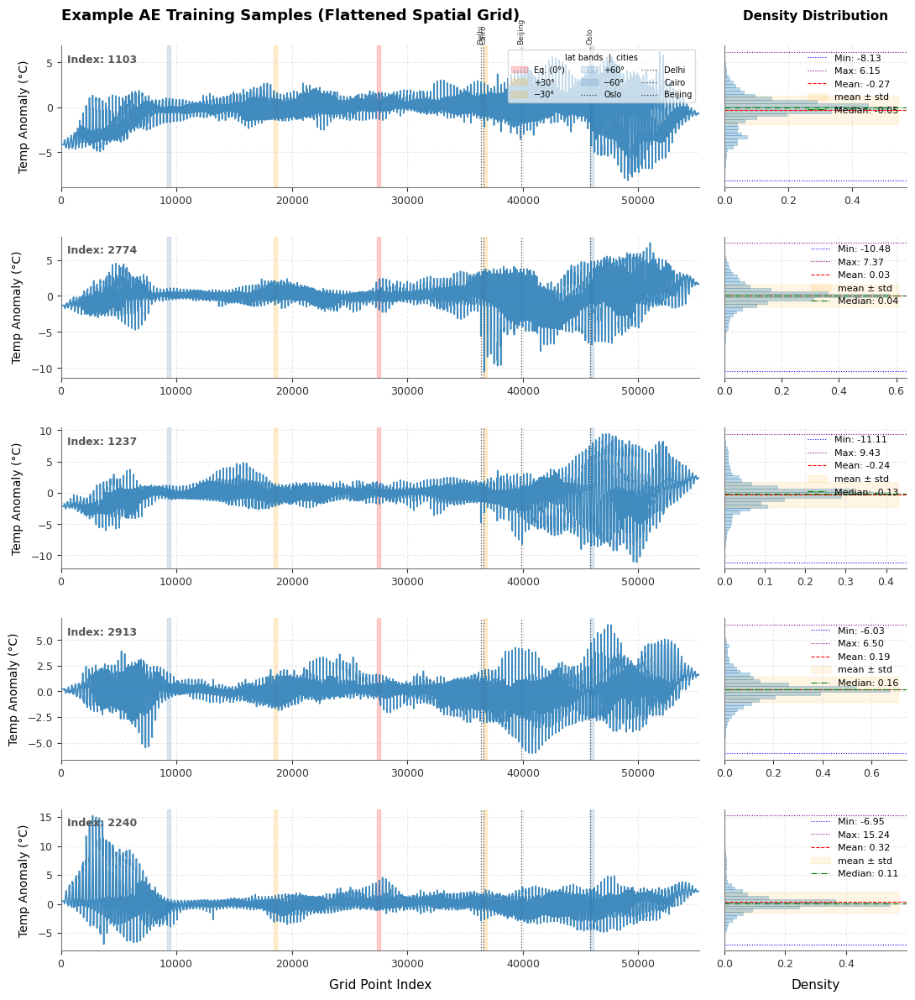

In [16]:
print(f"Randomly selected indices for testing: {random_indices_flat}")

nrows = len(random_indices_flat)

fig = plt.figure(figsize=(13, 2.8 * nrows), facecolor='#ffffff')
gs = GridSpec(nrows=nrows, ncols=2, width_ratios=[3.5, 1], wspace=0.06, hspace=0.35)

for ax_idx, test_idx in enumerate(random_indices_flat):

    test_sample = X_ae[test_idx, :]

    # ── Left axis: line plot ────────────────────────────────────────────────
    ax_line = fig.add_subplot(gs[ax_idx, 0])
    ax_line.plot(test_sample, color='#1f77b4', linewidth=1.2, alpha=0.85, zorder=3)

    # Latitude band vertical fills
    for label, b in lat_bands.items():
        ax_line.axvspan(
            b["flat_start"], b["flat_end"],
            alpha=0.18, color=b["color"], zorder=1,
            label=label if ax_idx == 0 else "_nolegend_",
        )

    # City vertical lines
    for cname, c in city_flat.items():
        ax_line.axvline(
            c["flat_idx"], color="black", lw=0.9, ls=":", alpha=0.7, zorder=2,
            label=cname if ax_idx == 0 else "_nolegend_",
        )
        if ax_idx == 0:
            ax_line.text(
                c["flat_idx"], 1.01, cname,
                transform=ax_line.get_xaxis_transform(),
                rotation=90, va="bottom", ha="center",
                fontsize=6.5, color="#333333",
            )

    if ax_idx == 0:
        ax_line.set_title('Example AE Training Samples (Flattened Spatial Grid)', fontsize=13, fontweight='bold', pad=22, loc='left')
        ax_line.legend(loc="upper right", fontsize=7, framealpha=0.7, ncol=3,
                       title="lat bands  |  cities", title_fontsize=7)
    if ax_idx == nrows - 1:
        ax_line.set_xlabel('Grid Point Index', fontsize=11, labelpad=8)

    ax_line.set_ylabel('Temp Anomaly (°C)', fontsize=10, labelpad=6)
    ax_line.grid(True, linestyle='--', alpha=0.4, color='#cccccc', zorder=0)
    ax_line.set_xlim(0, len(test_sample))
    ax_line.text(0.01, 0.88, f"Index: {test_idx}", transform=ax_line.transAxes,
                 fontsize=9, fontweight='semibold', color='#555555')

    # ── Right axis: density histogram ──────────────────────────────────────
    ax_hist = fig.add_subplot(gs[ax_idx, 1], sharey=ax_line)
    ax_hist.hist(test_sample, bins=40, density=True, orientation='horizontal',
                color='#1f77b4', alpha=0.3, edgecolor='#1f77b4', linewidth=0.6)
    mean_val   = test_sample.mean()
    median_val = np.median(test_sample)
    min_val    = test_sample.min()
    max_val    = test_sample.max()
    std_val    = test_sample.std()
    ax_hist.axhline(min_val,    color='blue',   linestyle=':',  linewidth=0.8, label=f'Min: {min_val:.2f}')
    ax_hist.axhline(max_val,    color='purple', linestyle=':',  linewidth=0.8, label=f'Max: {max_val:.2f}')
    ax_hist.axhline(mean_val,   color='red',    linestyle='--', linewidth=0.8, label=f'Mean: {mean_val:.2f}')
    ax_hist.fill_betweenx([mean_val + std_val, mean_val - std_val], 0, ax_hist.get_xlim()[1],
                          color='orange', alpha=0.1, label='mean ± std')
    ax_hist.axhline(median_val, color='green',  linestyle='-.', linewidth=0.8, label=f'Median: {median_val:.2f}')
    ax_hist.legend(loc='upper right', fontsize=8, frameon=False)

    if ax_idx == 0:
        ax_hist.set_title('Density Distribution', fontsize=11, fontweight='semibold', pad=22)
    if ax_idx == nrows - 1:
        ax_hist.set_xlabel('Density', fontsize=11, labelpad=8)

    ax_hist.grid(True, linestyle='--', alpha=0.4, color='#cccccc')
    plt.setp(ax_hist.get_yticklabels(), visible=False)
    ax_hist.yaxis.set_tick_params(left=False)

    for ax in [ax_line, ax_hist]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('#777777')
        ax.spines['bottom'].set_color('#777777')
        ax.tick_params(colors='#333333', labelsize=9)

plt.show()


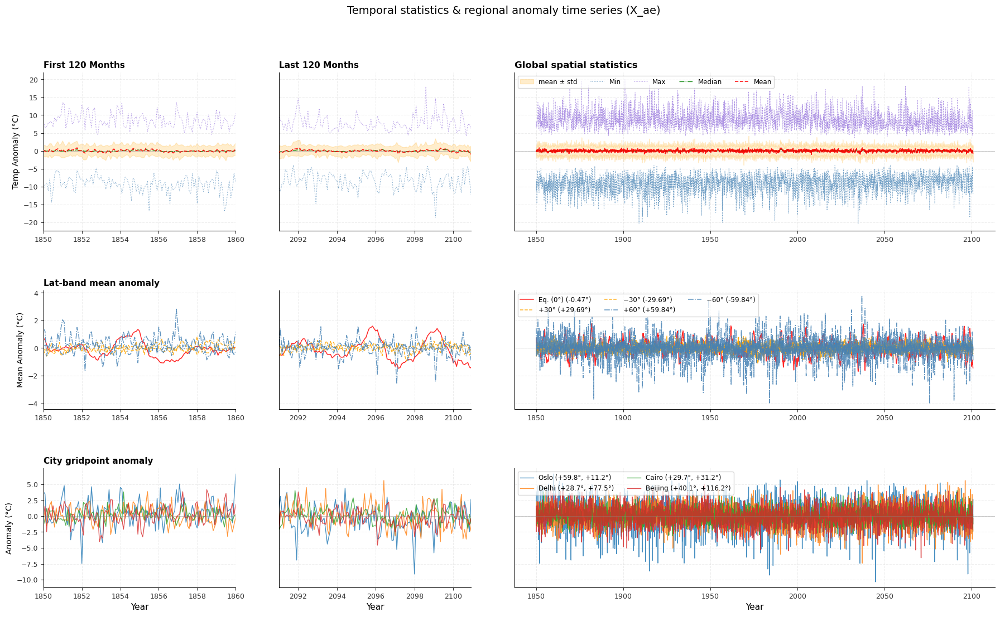

In [17]:
ts_stats, band_ts, city_ts = compute_temporal_stats_from_flat(
    X_ae=X_ae,
    lat_bands=lat_bands,
    city_flat=city_flat,
)

# 2. Define a numeric time axis t_num (example: years since 1850)
# If you have an xarray time coordinate, use its values converted to years:
# time = cmip6_data_raw['time'].values
# t_num = (time.astype('datetime64[M]').astype(int) / 12) + 1850
T = X_ae.shape[0]
t_num = 1850 + np.arange(T) / 12  # assuming monthly data starting Jan 1850

# 3. Plot
fig_temporal = plot_temporal_structure_flat(
    t_num=t_num,
    ts_stats=ts_stats,
    band_ts=band_ts,
    city_ts=city_ts,
    lat_bands=lat_bands,
    city_flat=city_flat,
    units="°C",
    zoom_len=120,
    title="Temporal statistics & regional anomaly time series (X_ae)",
)
plt.show()


## pr

In [18]:
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="pr",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",  # (n_time, n_lat * n_lon)
)
X_ae_conv = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="pr",
    picontrol_baseline=picontrol_baseline,
    data_type="conv",  # (n_time, n_lat, n_lon)
)

X_raw = cmip6_data_raw["pr"].isel(ens=0).values[:, np.newaxis, :, :]  # (T, 1, n_lat, n_lon)
print(f"X_ae_conv shape : {X_ae_conv.shape}")
print(f"X_ae_conv range : [{X_ae_conv.min():.4f}, {X_ae_conv.max():.4f}]")
print(f"X_ae_conv std   : {X_ae_conv.std():.4f}")


X_ae_conv shape : (3012, 1, 192, 288)
X_ae_conv range : [-0.0003, 0.0010]
X_ae_conv std   : 0.0000


### conv.

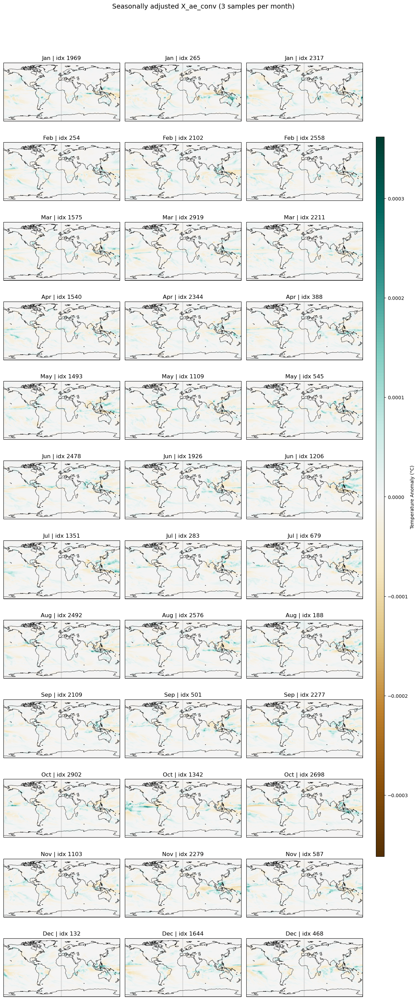

In [19]:
fig = plot_monthly_samples_grid(
    X=X_ae_conv,
    random_indices=random_indices_maps,
    extent=extent,
    month_names=month_names,
    cmap="BrBG",
    suptitle="Seasonally adjusted X_ae_conv (3 samples per month)",
)
plt.show()


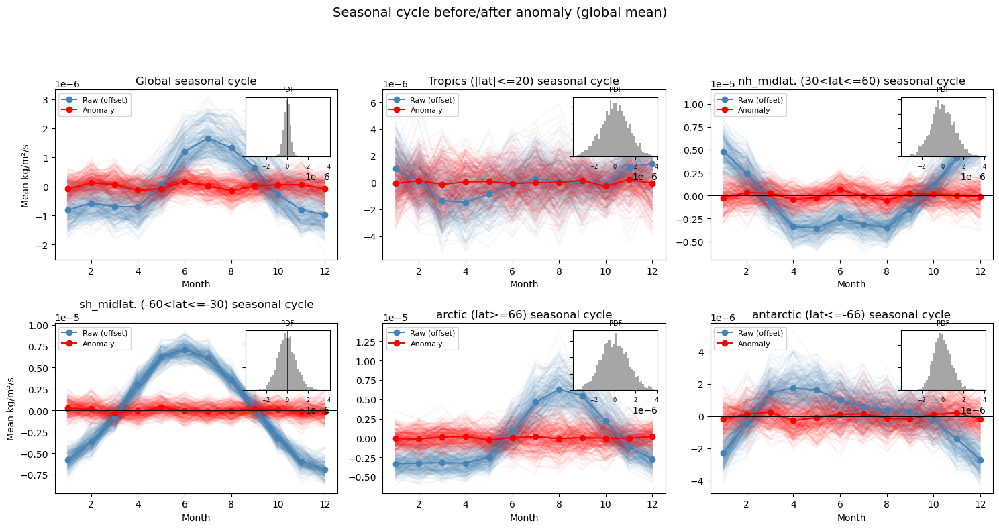

In [20]:
nrows = 2
ncols = np.ceil(len(region_masks) / nrows).astype(int)
seasonal_cycle_fig = seasonal_cycle_before_after(
    X_raw=X_raw,                # (T, 1, n_lat, n_lon)
    X_ae_conv=X_ae_conv,           # (T, 1, n_lat, n_lon)
    month_idx=month_idx,        # length T, values 0..11
    region_masks=region_masks,                  # (n_lat, n_lon) bool
    figtitle="Seasonal cycle before/after anomaly (global mean)",
    units="kg/m²/s",
    subplot_kwargs={
        "nrows": nrows,
        "ncols": ncols,
        "figsize": (5 * ncols, 4 * nrows),
        "sharey": False
    }
)
plt.show()


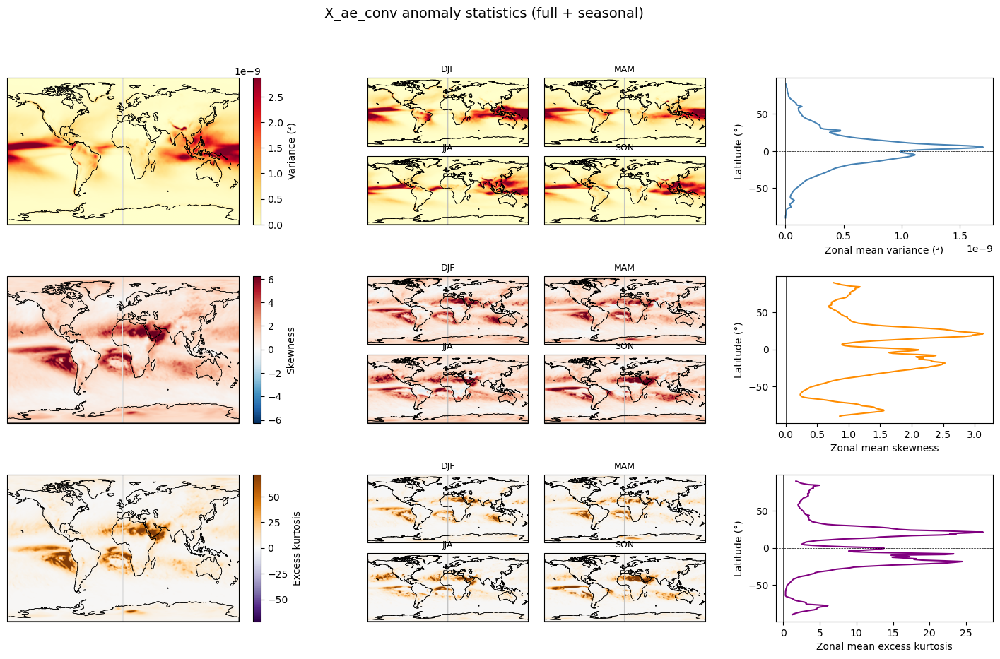

In [21]:
stats_core, fig_core = summarize_anomaly_field_core(
    X_ae_conv=X_ae_conv,
    lats=lats,
    lons=lons,
    extent=extent,
    month_idx=month_idx,
    units="",
    title="X_ae_conv anomaly statistics (full + seasonal)",
)
plt.show()


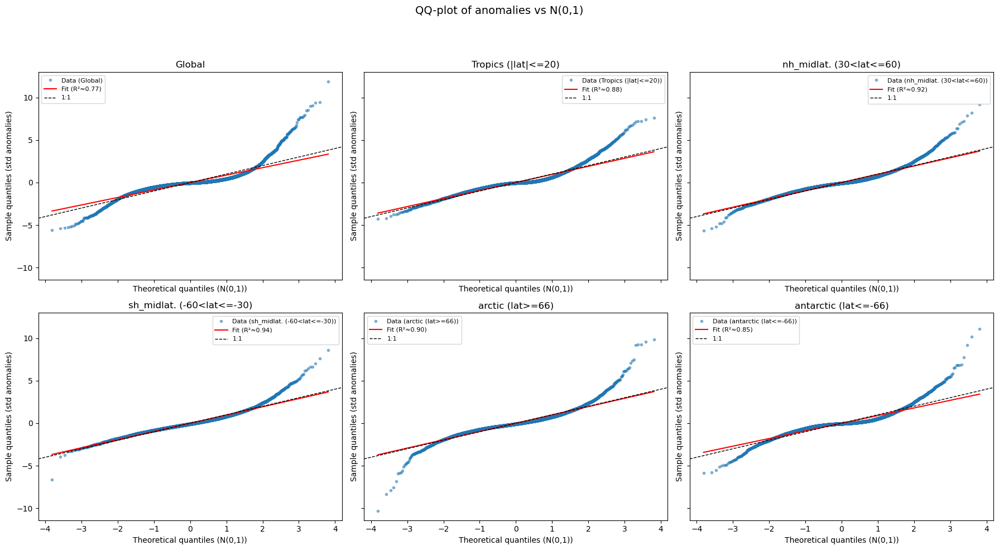

In [22]:
fig_qq = qqplot_anomaly_field(
    X_ae_conv, lats, lons,
    region_masks=region_masks,
    subplot_kwargs={
        "nrows": 2, "ncols": 3, "figsize": (18, 10), "sharex": True, "sharey": True},
)


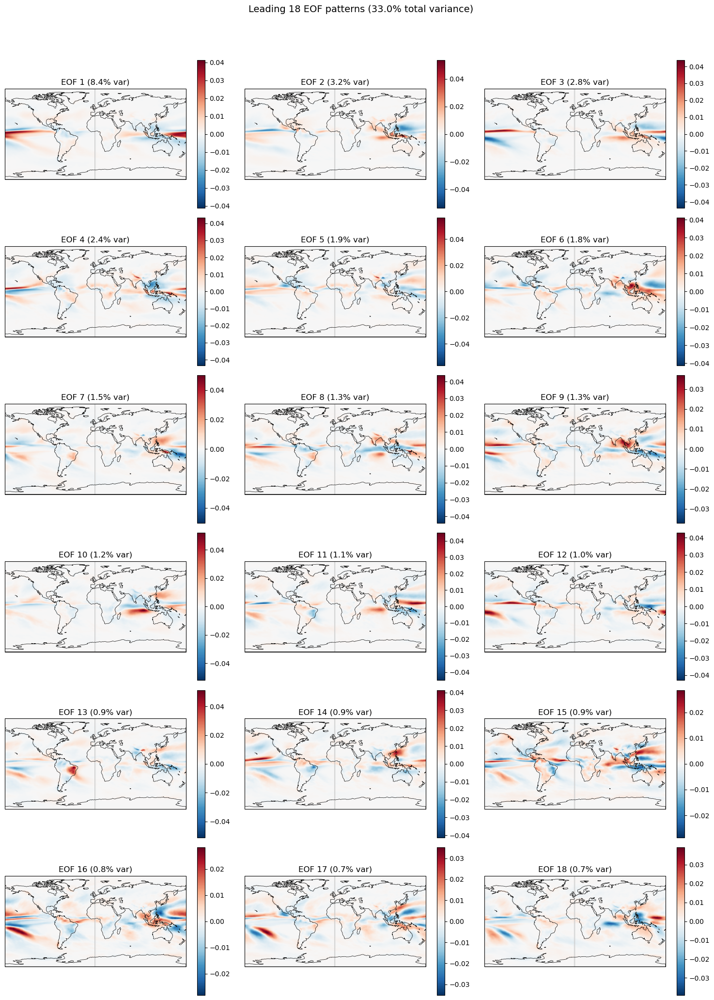

In [23]:
eofs, pcs, var_frac = compute_eofs(X_ae_conv, n_modes=18)
fig_eofs = plot_eof_maps(eofs, var_frac, lats, lons, extent)


### MLP

Randomly selected indices for testing: [1103 2774 1237 2913 2240]


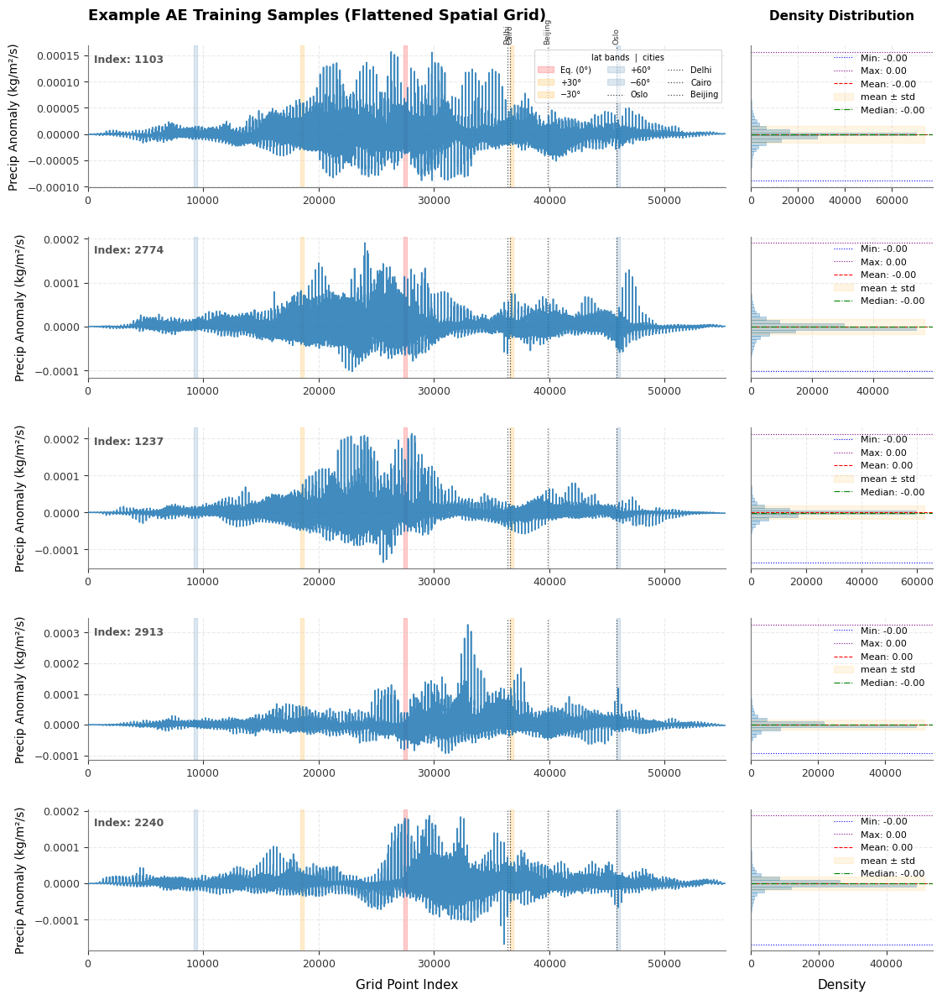

In [24]:
print(f"Randomly selected indices for testing: {random_indices_flat}")

nrows = len(random_indices_flat)

fig = plt.figure(figsize=(13, 2.8 * nrows), facecolor='#ffffff')
gs = GridSpec(nrows=nrows, ncols=2, width_ratios=[3.5, 1], wspace=0.06, hspace=0.35)

for ax_idx, test_idx in enumerate(random_indices_flat):

    test_sample = X_ae[test_idx, :]

    # ── Left axis: line plot ────────────────────────────────────────────────
    ax_line = fig.add_subplot(gs[ax_idx, 0])
    ax_line.plot(test_sample, color='#1f77b4', linewidth=1.2, alpha=0.85, zorder=3)

    # Latitude band vertical fills
    for label, b in lat_bands.items():
        ax_line.axvspan(
            b["flat_start"], b["flat_end"],
            alpha=0.18, color=b["color"], zorder=1,
            label=label if ax_idx == 0 else "_nolegend_",
        )

    # City vertical lines
    for cname, c in city_flat.items():
        ax_line.axvline(
            c["flat_idx"], color="black", lw=0.9, ls=":", alpha=0.7, zorder=2,
            label=cname if ax_idx == 0 else "_nolegend_",
        )
        if ax_idx == 0:
            ax_line.text(
                c["flat_idx"], 1.01, cname,
                transform=ax_line.get_xaxis_transform(),
                rotation=90, va="bottom", ha="center",
                fontsize=6.5, color="#333333",
            )

    if ax_idx == 0:
        ax_line.set_title('Example AE Training Samples (Flattened Spatial Grid)', fontsize=13, fontweight='bold', pad=22, loc='left')
        ax_line.legend(loc="upper right", fontsize=7, framealpha=0.7, ncol=3,
                       title="lat bands  |  cities", title_fontsize=7)
    if ax_idx == nrows - 1:
        ax_line.set_xlabel('Grid Point Index', fontsize=11, labelpad=8)

    ax_line.set_ylabel('Precip Anomaly (kg/m²/s)', fontsize=10, labelpad=6)
    ax_line.grid(True, linestyle='--', alpha=0.4, color='#cccccc', zorder=0)
    ax_line.set_xlim(0, len(test_sample))
    ax_line.text(0.01, 0.88, f"Index: {test_idx}", transform=ax_line.transAxes,
                 fontsize=9, fontweight='semibold', color='#555555')

    # ── Right axis: density histogram ──────────────────────────────────────
    ax_hist = fig.add_subplot(gs[ax_idx, 1], sharey=ax_line)
    ax_hist.hist(test_sample, bins=40, density=True, orientation='horizontal',
                color='#1f77b4', alpha=0.3, edgecolor='#1f77b4', linewidth=0.6)
    mean_val   = test_sample.mean()
    median_val = np.median(test_sample)
    min_val    = test_sample.min()
    max_val    = test_sample.max()
    std_val    = test_sample.std()
    ax_hist.axhline(min_val,    color='blue',   linestyle=':',  linewidth=0.8, label=f'Min: {min_val:.2f}')
    ax_hist.axhline(max_val,    color='purple', linestyle=':',  linewidth=0.8, label=f'Max: {max_val:.2f}')
    ax_hist.axhline(mean_val,   color='red',    linestyle='--', linewidth=0.8, label=f'Mean: {mean_val:.2f}')
    ax_hist.fill_betweenx([mean_val + std_val, mean_val - std_val], 0, ax_hist.get_xlim()[1],
                          color='orange', alpha=0.1, label='mean ± std')
    ax_hist.axhline(median_val, color='green',  linestyle='-.', linewidth=0.8, label=f'Median: {median_val:.2f}')
    ax_hist.legend(loc='upper right', fontsize=8, frameon=False)

    if ax_idx == 0:
        ax_hist.set_title('Density Distribution', fontsize=11, fontweight='semibold', pad=22)
    if ax_idx == nrows - 1:
        ax_hist.set_xlabel('Density', fontsize=11, labelpad=8)

    ax_hist.grid(True, linestyle='--', alpha=0.4, color='#cccccc')
    plt.setp(ax_hist.get_yticklabels(), visible=False)
    ax_hist.yaxis.set_tick_params(left=False)

    for ax in [ax_line, ax_hist]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('#777777')
        ax.spines['bottom'].set_color('#777777')
        ax.tick_params(colors='#333333', labelsize=9)

plt.show()


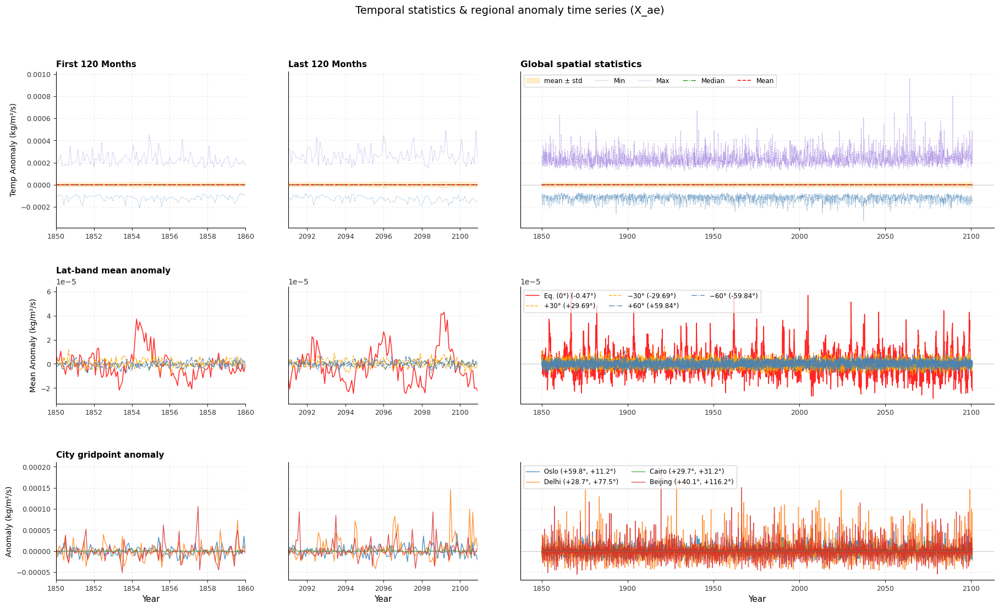

In [25]:
ts_stats, band_ts, city_ts = compute_temporal_stats_from_flat(
    X_ae=X_ae,
    lat_bands=lat_bands,
    city_flat=city_flat,
)

# 2. Define a numeric time axis t_num (example: years since 1850)
# If you have an xarray time coordinate, use its values converted to years:
# time = cmip6_data_raw['time'].values
# t_num = (time.astype('datetime64[M]').astype(int) / 12) + 1850
T = X_ae.shape[0]
t_num = 1850 + np.arange(T) / 12  # assuming monthly data starting Jan 1850

# 3. Plot
fig_temporal = plot_temporal_structure_flat(
    t_num=t_num,
    ts_stats=ts_stats,
    band_ts=band_ts,
    city_ts=city_ts,
    lat_bands=lat_bands,
    city_flat=city_flat,
    units="kg/m²/s",
    zoom_len=120,
    title="Temporal statistics & regional anomaly time series (X_ae)",
)
plt.show()
